In [11]:
import tensorflow as tf
from tensorflow import keras
import numpy as np

!pip install einops -q

In [40]:
from tensorflow.keras.applications import xception

model = xception.Xception(weights="imagenet",
                          include_top=False) # CNN의 필터만 필요
feature_extractors = []

for i in (2, 4, 12, 14):
    layer = model.get_layer(f"block{i}_sepconv1")
    feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)
    feature_extractors.append(feature_extractor)


In [42]:
from einops import rearrange

def generate_single_image_batch(height, width):
    image = tf.random.uniform((height, width, 3))
    return rearrange(image, "h w c -> 1 h w c") # add batch dimension

In [69]:
def compute_loss(image_batch, feature_extractor, filter_index):
    activation = feature_extractor(image_batch)
    filter_activation = activation[:, 2:-2, 2:-2, filter_index] # 2:-2 -> remove border effect
    return tf.reduce_mean(filter_activation) # filter의 activation 평균값

In [44]:
@tf.function
def gradient_ascent_step(image_batch, feature_extractor, filter_index, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(image_batch)
        loss = compute_loss(image_batch, feature_extractor, filter_index)

    grads = tape.gradient(loss, image_batch)
    grads = tf.math.l2_normalize(grads)
    image_batch += learning_rate * grads # gradient ascent
    return image_batch

def generate_filter_pattern_image(image_height, image_width,
                      feature_extractor, filter_index, learning_rate):
    image_batch = generate_single_image_batch(height=image_height, width=image_width)
    for _ in range(10):
        image_batch = gradient_ascent_step(image_batch, feature_extractor, filter_index, learning_rate)
    return image_batch[0].numpy()

In [45]:
# 텐서 값은 [0, 255] 사이의 수로 바꾸기 위함
def deprocess_image(image):
    image -= image.mean()
    image /= image.std()
    image *= 64
    image += 128
    image = np.clip(image, 0, 255).astype("uint8") # [0, 255] 범위로 값 정규화
    image = image[25:-25, 25:-25, :] # 25:-25 -> remove border effect
    return image

In [52]:
filter_pattern_images = []

for feature_extractor in feature_extractors[:5]:
    pattern_images = []
    for i in range(20):
        pattern_image = generate_filter_pattern_image(200, 200, feature_extractor, i, 10.)
        pattern_image = deprocess_image(pattern_image)
        pattern_images.append(pattern_image)

    filter_pattern_images.append(pattern_images)

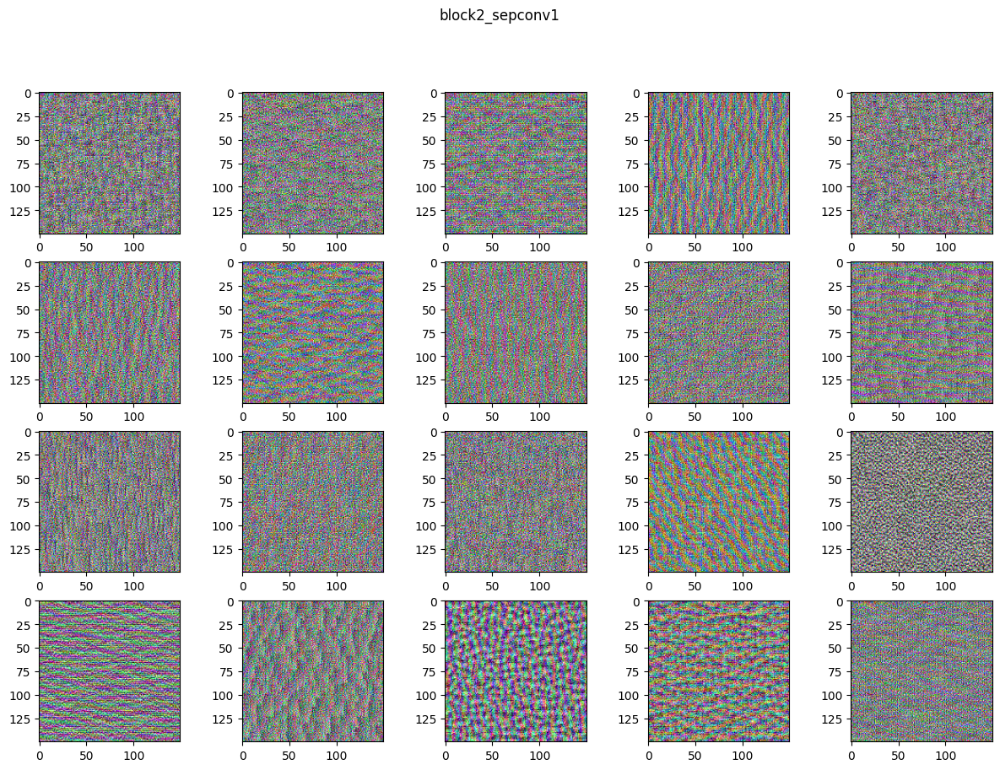

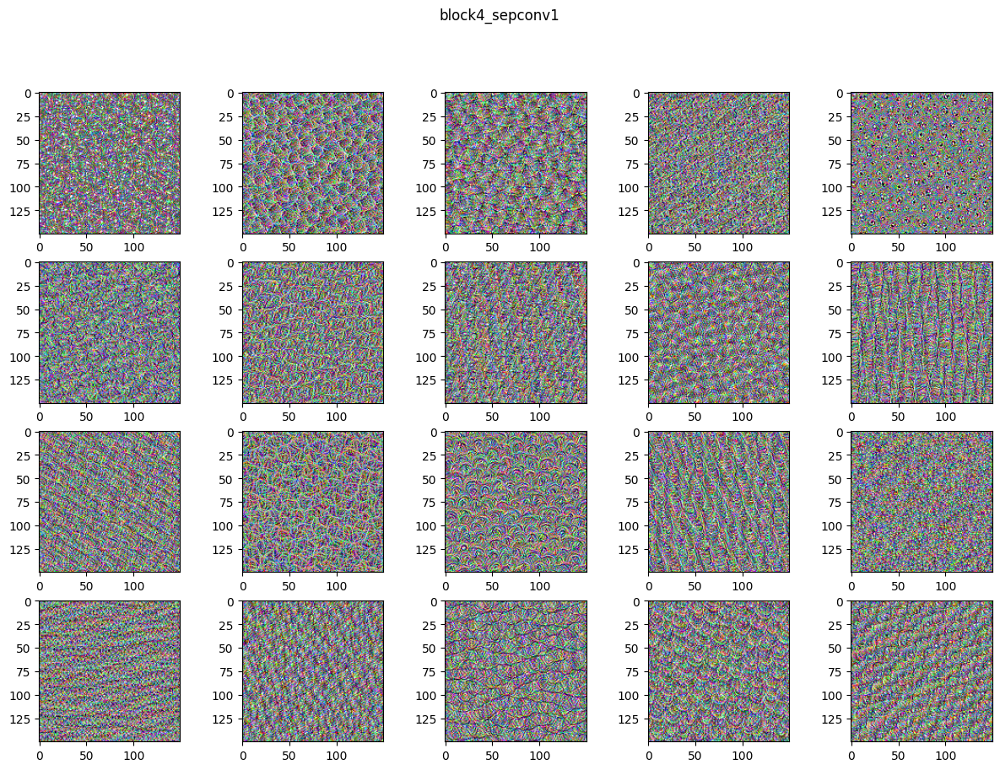

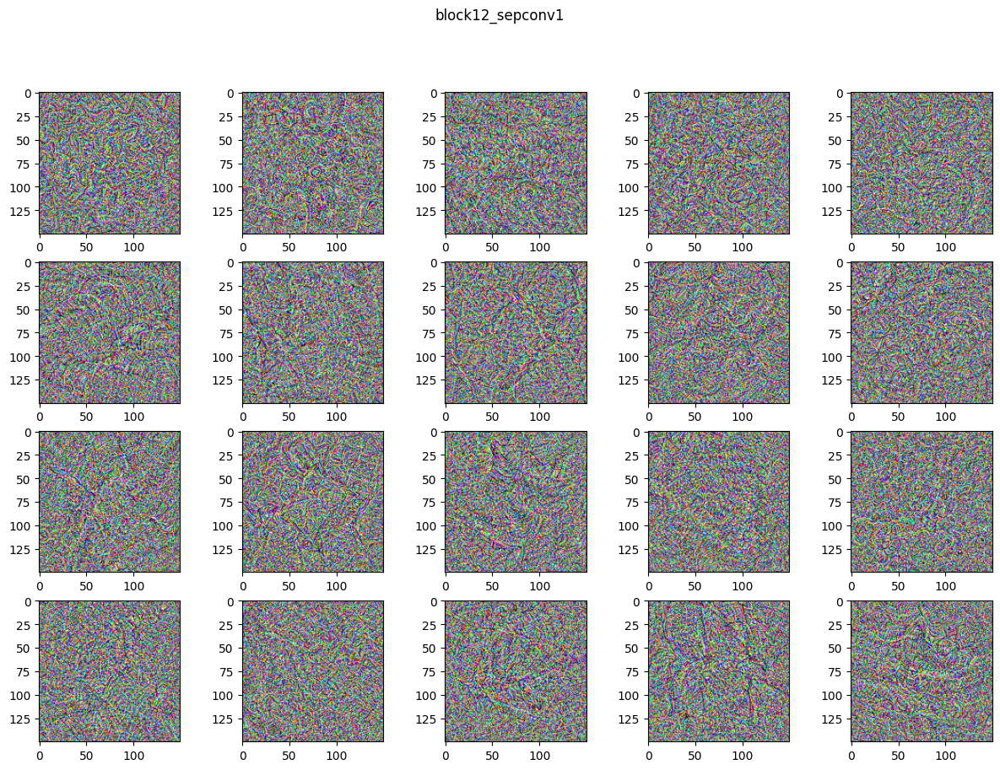

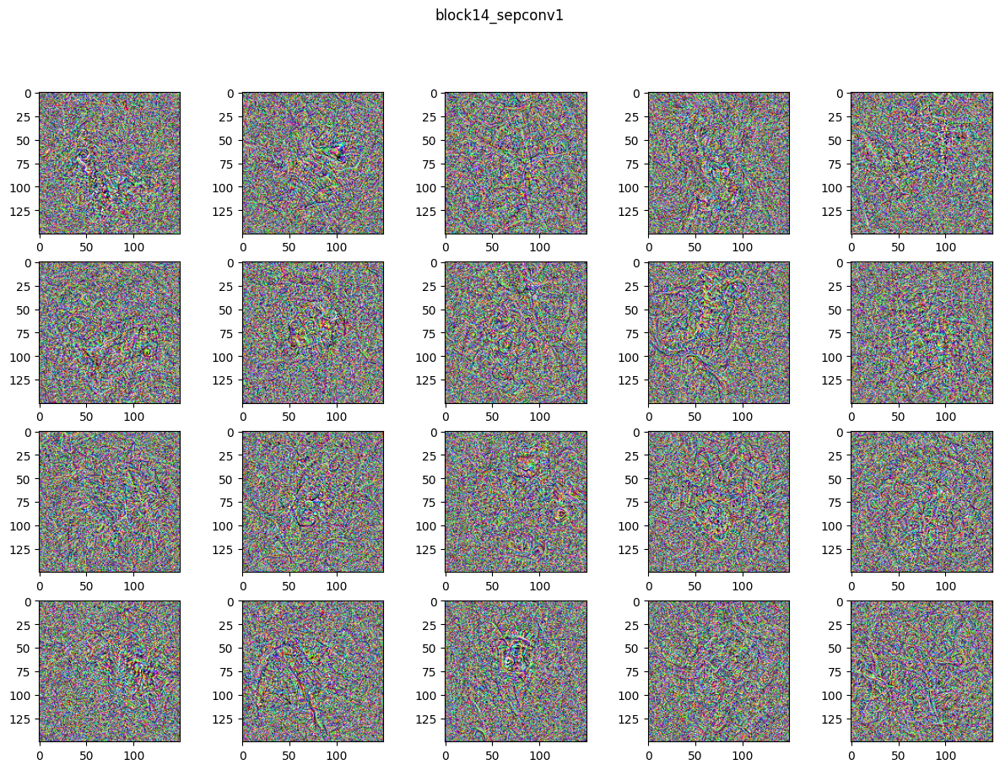

In [68]:
import matplotlib.pyplot as plt

def plot_filter_pattern_images(pattern_images, layer_name):
    plt.figure(figsize=(15, 10))
    plt.suptitle(layer_name)
    plot_count = 1

    for pattern_image in pattern_images:
        plt.subplot(4, 5, plot_count)
        plot_count += 1

        plt.imshow(pattern_image)

    plt.show()

plot_filter_pattern_images(filter_pattern_images[0], "block2_sepconv1")
plot_filter_pattern_images(filter_pattern_images[1], "block4_sepconv1")
plot_filter_pattern_images(filter_pattern_images[2], "block12_sepconv1")
plot_filter_pattern_images(filter_pattern_images[3], "block14_sepconv1")
